# Libraries

In [40]:
import os
import json
from zipfile import ZipFile

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
import cv2
import albumentations as A
from sklearn import metrics as sk_metrics

from google.colab import drive

# Data Import

In [41]:
platform = 'colab' # There are two options: ["kaggle", "colab"]
if platform == 'colab':
  drive.mount('/content/gdrive')

  DATA_DIR = '/content/gdrive/MyDrive/kaggle/kaggle-competition-datasets/cassava-leaf-disease-classification/'
  train_zip_path = DATA_DIR + "train_images.zip"
  train_img_path = '/content/train/train_images'

  if not os.path.isdir(train_img_path):
    with ZipFile(train_zip_path, 'r') as zip_f: 
      zip_f.extractall(path=train_img_path) 
else:
  DATA_DIR = "../input/cassava-leaf-disease-classification/"
  train_img_path = "../input/cassava-leaf-disease-classification/train_images"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Dataset Overview

In [42]:
with open(os.path.join(DATA_DIR, "label_num_to_disease_map.json")) as file:
    map_classes = json.loads(file.read())
    map_classes = {int(k) : v for k, v in map_classes.items()}
    
print(json.dumps(map_classes, indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


In [43]:
input_files = os.listdir(train_img_path)
print(f"Number of train images: {len(input_files)}")

Number of train images: 21397


In [44]:
# look into the dimension of the first 30 images
img_shapes = {}
for image_name in os.listdir(os.path.join(train_img_path))[:30]:
      image = cv2.imread(os.path.join(train_img_path, image_name))
      img_shapes[image.shape] = img_shapes.get(image.shape, 0) + 1

print(img_shapes)

{(600, 800, 3): 30}


In [45]:
df_train = pd.read_csv(os.path.join(DATA_DIR, "train.csv"))

df_train["class_name"] = df_train["label"].map(map_classes)

df_train

,image_id,label,class_name
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)
...,...,...,...
21392,999068805.jpg,3,Cassava Mosaic Disease (CMD)
21393,999329392.jpg,3,Cassava Mosaic Disease (CMD)
21394,999474432.jpg,1,Cassava Brown Streak Disease (CBSD)
21395,999616605.jpg,4,Healthy


In [46]:
df_train["class_name"].value_counts(sort=True)

Cassava Mosaic Disease (CMD)           13158
Healthy                                 2577
Cassava Green Mottle (CGM)              2386
Cassava Brown Streak Disease (CBSD)     2189
Cassava Bacterial Blight (CBB)          1087
Name: class_name, dtype: int64

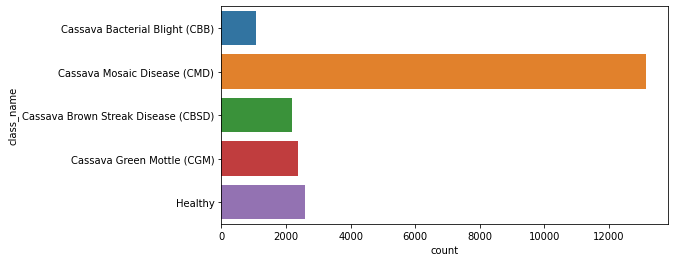

In [47]:
plt.figure(figsize=(8, 4))
sn.countplot(y="class_name", data=df_train);

In [48]:
def visualize_batch(image_ids, labels):
    plt.figure(figsize=(16, 12))
    
    for ind, (image_id, label) in enumerate(zip(image_ids, labels)):
        # print(image_id)
        # print(os.path.join(DATA_DIR, image_id))
        plt.subplot(3, 3, ind + 1)
        image = cv2.imread(os.path.join(train_img_path, image_id))
        # print(image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(f"Class: {label}", fontsize=12)
        plt.axis("off")
    plt.show()

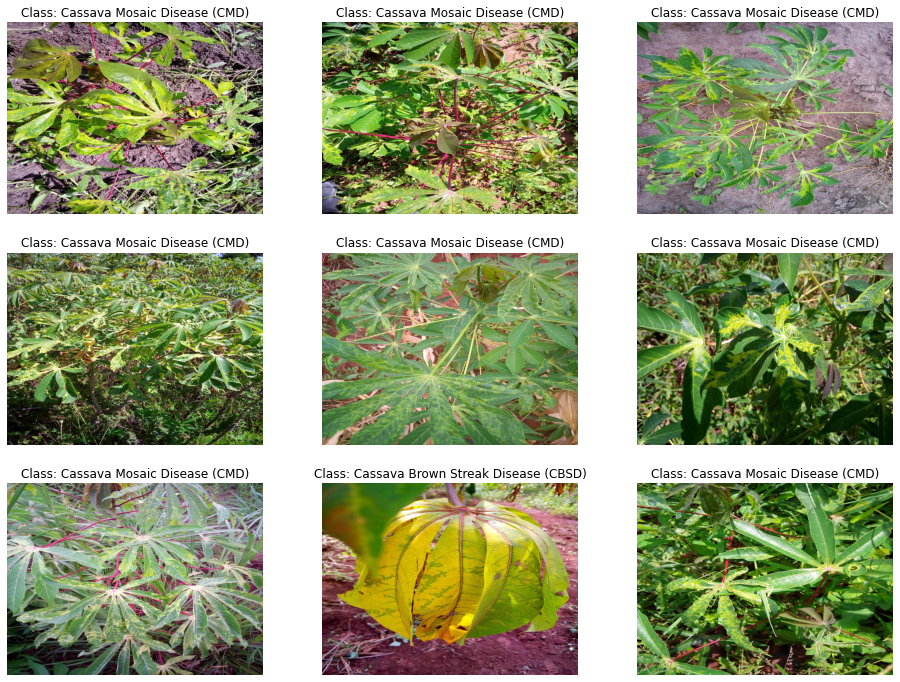

In [49]:
tmp_df = df_train.sample(9)
image_ids = tmp_df["image_id"].values
labels = tmp_df["class_name"].values

visualize_batch(image_ids, labels)

# 0 - CBB - Cassava Bacterial Blight

Total train images for class 0: 1087


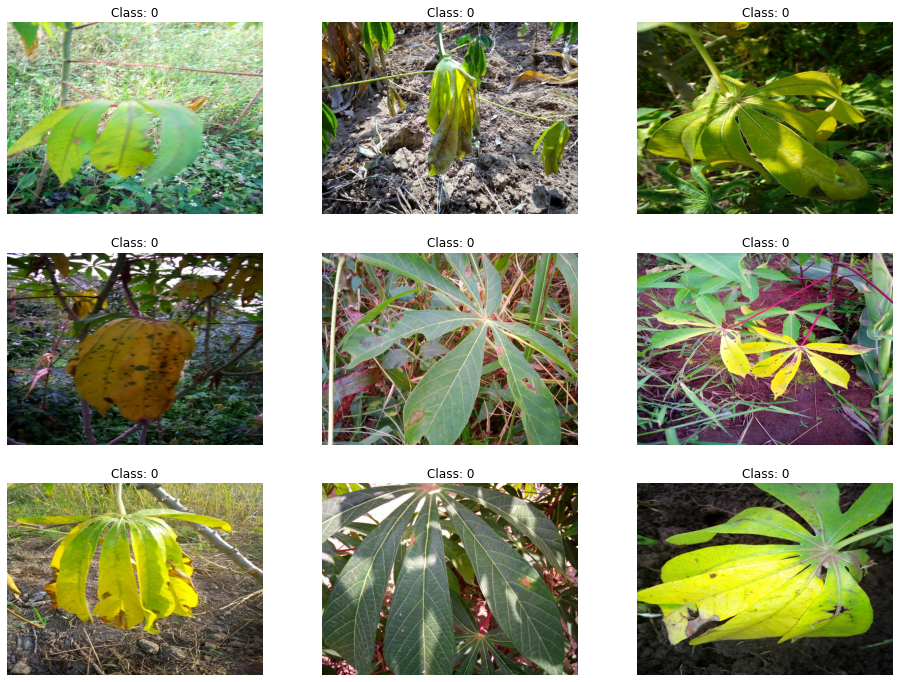

In [50]:
tmp_df = df_train[df_train["label"] == 0]
print(f"Total train images for class 0: {tmp_df.shape[0]}")

tmp_df = tmp_df.sample(9)
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)

# 1 - CBSD - Cassava Brown Streak Disease

Total train images for class 1: 2189


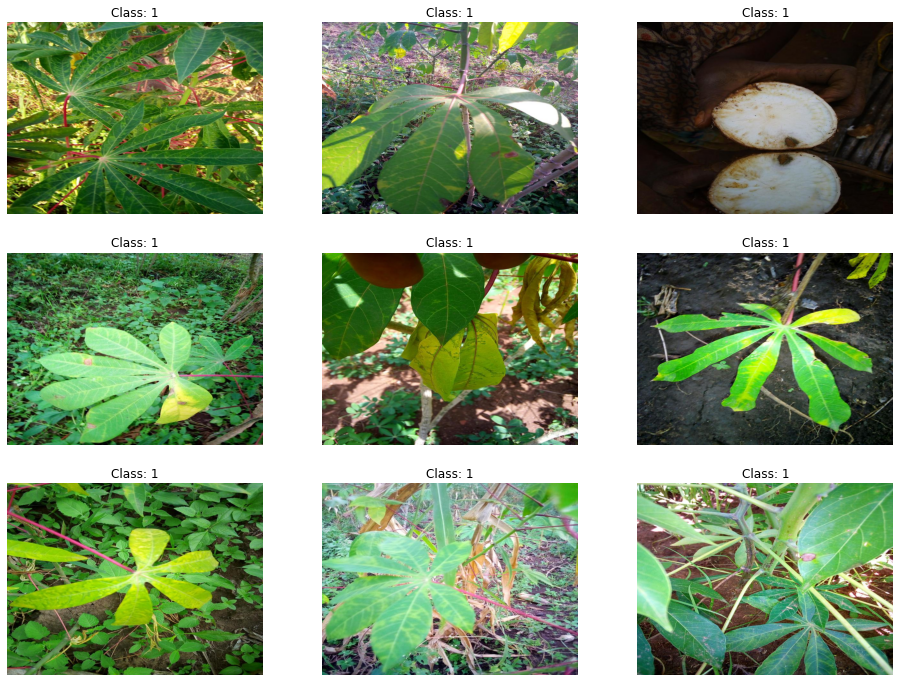

In [51]:
tmp_df = df_train[df_train["label"] == 1]
print(f"Total train images for class 1: {tmp_df.shape[0]}")

tmp_df = tmp_df.sample(9)
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)

# 2 - CGM - Cassava Green Mottle

Total train images for class 2: 2386


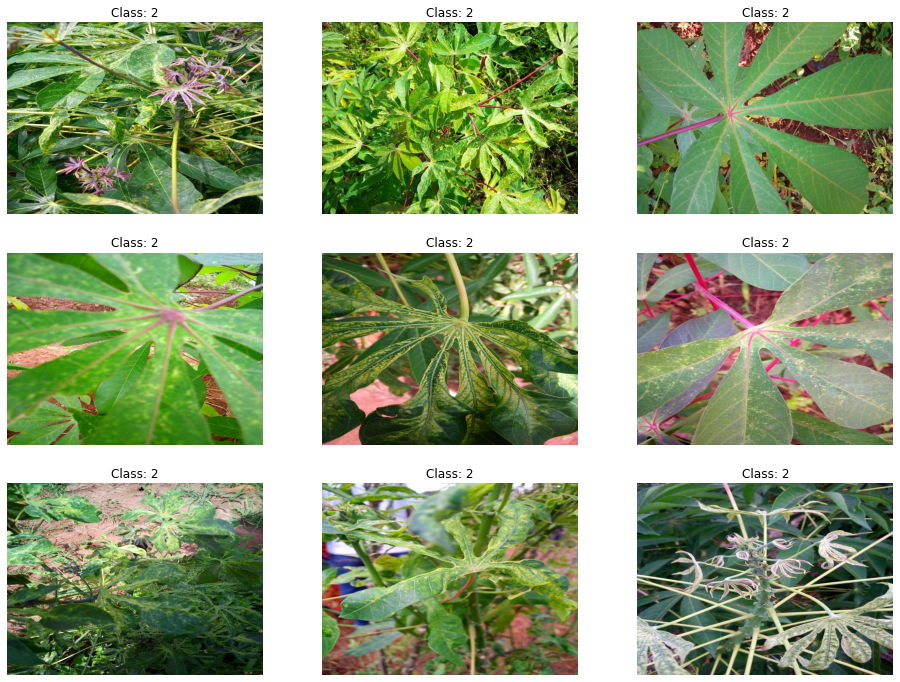

In [52]:
tmp_df = df_train[df_train["label"] == 2]
print(f"Total train images for class 2: {tmp_df.shape[0]}")

tmp_df = tmp_df.sample(9)
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)

# 3 - CMD - Cassava Masaic Disease

Total train images for class 3: 13158


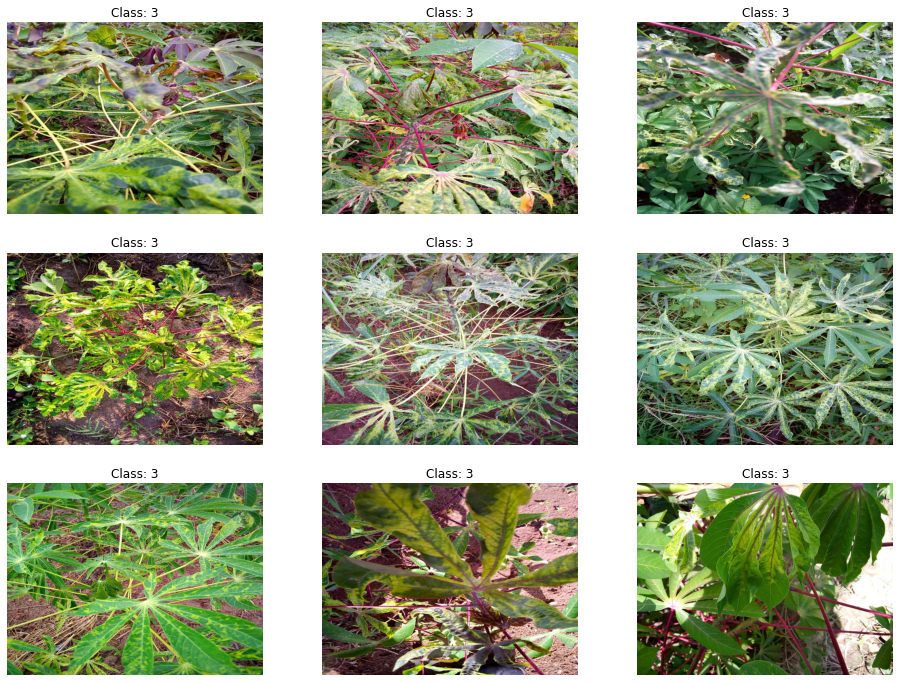

In [53]:
tmp_df = df_train[df_train["label"] == 3]
print(f"Total train images for class 3: {tmp_df.shape[0]}")

tmp_df = tmp_df.sample(9)
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)

# 4 - Healthy

Total train images for class 4: 2577


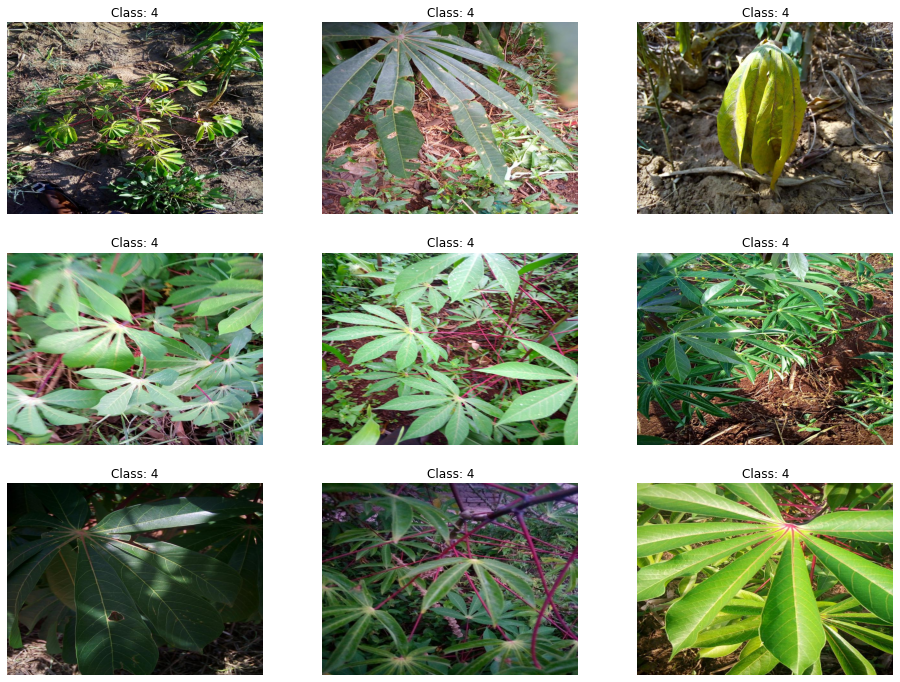

In [54]:
tmp_df = df_train[df_train["label"] == 4]
print(f"Total train images for class 4: {tmp_df.shape[0]}")

tmp_df = tmp_df.sample(9)
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)

# Augmentation Example

In [55]:
def plot_augmentation(image_id, transform):
    plt.figure(figsize=(16, 4))
    img = cv2.imread(os.path.join(train_img_path, image_id))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")

    plt.show()

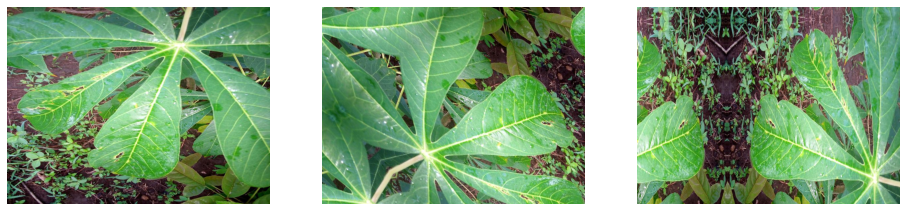

In [56]:
transform_shift_scale_rotate = A.ShiftScaleRotate(
    p=1.0, 
    shift_limit=(-0.3, 0.3), 
    scale_limit=(-0.1, 0.1), 
    rotate_limit=(-180, 180), 
    interpolation=0, 
    border_mode=4, 
)

plot_augmentation("1003442061.jpg", transform_shift_scale_rotate)

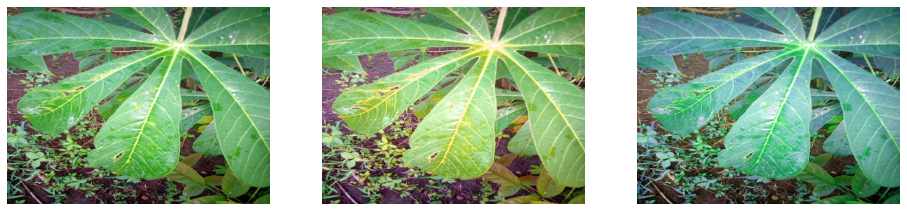

In [57]:
transform_saturation = A.HueSaturationValue(
  p=1.0,
  hue_shift_limit=50,
  sat_shift_limit=60,
  val_shift_limit=30,
)

plot_augmentation("1003442061.jpg", transform_saturation)

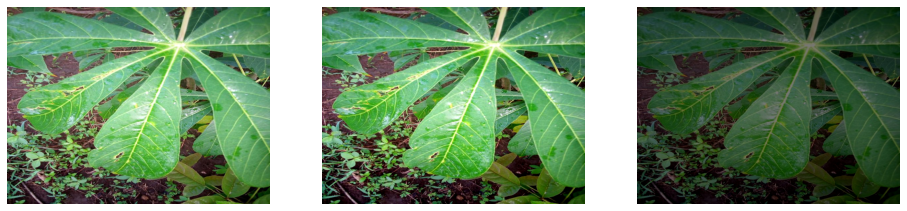

In [58]:
transform_brightness = A.RandomBrightnessContrast(
  p=1.0,
  brightness_limit=0.3,
  contrast_limit=0.5,
)

plot_augmentation("1003442061.jpg", transform_brightness)

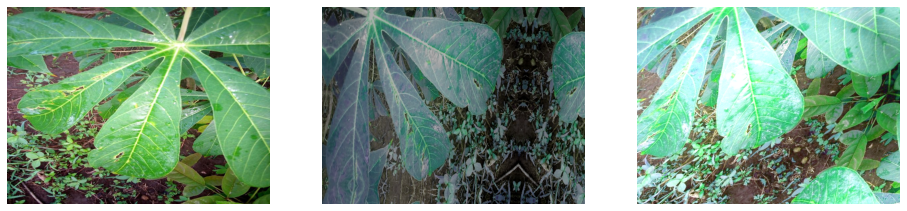

In [59]:
transform = A.Compose(
    transforms=[
        transform_shift_scale_rotate,
        transform_saturation,
        transform_brightness
    ],
    p=1.0,
)

plot_augmentation("1003442061.jpg", transform)